<a href="https://colab.research.google.com/github/GonsalesAlisson/Projects/blob/develop/In_Progress_Predict_enzyme_thermostability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

In [ ]:
!pip install numpy
!pip install scipy
!pip install cython
!pip install sparsesvd

# **Methods and Materials**
This notebook aims to produce a predictive model for thermal stability of proteins. The steps or tasks involved on modelling process are summarized below.
*   
*   **Import data and update train set**- Considered training data are originally polluted with bad entries. Corrections to this preliminar dataset are provided and updated on this section.
*   **Tokenization and Feature Extraction** - Here, different approaches for tokenization and feature extraction are applied to the initial protein-sequence data and a initial task of quantile prediction for thermal data are considered.
*   **Feature evaluation and analysis** - The scope of extracted features on the last section are considered and a distributional analysis is made for future optimization of the regression task on thermal data.

*   **Regression Task** - Future







In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/Competicoes

/content/drive/MyDrive/Colab Notebooks/Competicoes


# **Import data and update train set**

In [ ]:
df_train = pd.read_csv("train.csv").set_index('seq_id')
df_test = pd.read_csv("test.csv").set_index('seq_id')
df_train_updates = pd.read_csv("train_updates.csv").set_index('seq_id')

In [ ]:
df_train.head()

,protein_sequence,pH,data_source,tm
seq_id,,,,
0,AAAAKAAALALLGEAPEVVDIWLPAGWRQPFRVFRLERKGDGVLVG...,7.0,doi.org/10.1038/s41592-020-0801-4,75.7
1,AAADGEPLHNEEERAGAGQVGRSLPQESEEQRTGSRPRRRRDLGSR...,7.0,doi.org/10.1038/s41592-020-0801-4,50.5
2,AAAFSTPRATSYRILSSAGSGSTRADAPQVRRLHTTRDLLAKDYYA...,7.0,doi.org/10.1038/s41592-020-0801-4,40.5
3,AAASGLRTAIPAQPLRHLLQPAPRPCLRPFGLLSVRAGSARRSGLL...,7.0,doi.org/10.1038/s41592-020-0801-4,47.2
4,AAATKSGPRRQSQGASVRTFTPFYFLVEPVDTLSVRGSSVILNCSA...,7.0,doi.org/10.1038/s41592-020-0801-4,49.5


In [ ]:
df_train_updates.head()

,protein_sequence,pH,data_source,tm
seq_id,,,,
69,NaN,NaN,NaN,NaN
70,NaN,NaN,NaN,NaN
71,NaN,NaN,NaN,NaN
72,NaN,NaN,NaN,NaN
73,NaN,NaN,NaN,NaN


In [ ]:
nan_features = df_train_updates.isna().all('columns')
nan_features_index = df_train_updates[nan_features].index
df_train = df_train.drop(index=nan_features_index)

In [ ]:
nan_features_index.shape

(2409,)

In [ ]:
df_train_updates.shape

(2434, 4)

In [ ]:
swap_ph_tm = df_train_updates[~nan_features].index
df_train.loc[swap_ph_tm, ["pH", "tm"]] = df_train_updates.loc[swap_ph_tm, ["pH", "tm"]]

In [ ]:
df_train.to_csv("train_correct.csv")

We want to consider here protein sequences with similar lenghts. Below we remove the outliers with long sequences by the boxplot rule.

In [ ]:
df_train['protein_length'] = [len(x) for x in df_train['protein_sequence']]

(array([2.6315e+04, 2.2030e+03, 3.3400e+02, 7.1000e+01, 2.6000e+01,
        1.9000e+01, 6.0000e+00, 1.0000e+00, 4.0000e+00, 2.0000e+00]),
 array([5.0000e+00, 8.8430e+02, 1.7636e+03, 2.6429e+03, 3.5222e+03,
        4.4015e+03, 5.2808e+03, 6.1601e+03, 7.0394e+03, 7.9187e+03,
        8.7980e+03]),
 <a list of 10 Patch objects>)

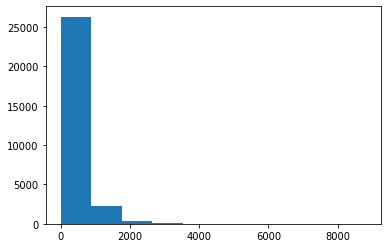

In [ ]:
plt.hist(df_train['protein_length'])

In [ ]:
outliers = get_outliers(df_train['protein_length'])
len(outliers)
df_outliers = df_train.loc[outliers,:]
df_train.drop(outliers,axis=0,inplace=True)

df_outliers.to_csv('outliers.csv')
df_train.to_csv('no_outliers.csv')

325.0 1024.5 -275.5


(array([1442., 5679., 5348., 4679., 4052., 2190., 1434., 1042.,  728.,
         547.]),
 array([   5. ,  106.9,  208.8,  310.7,  412.6,  514.5,  616.4,  718.3,
         820.2,  922.1, 1024. ]),
 <a list of 10 Patch objects>)

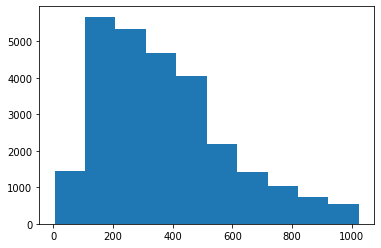

In [ ]:
plt.hist(df_train['protein_length'])

# **Tokenization and Feature Extraction**

A critical step for dimension reduction is choosing a good Tokenization step. To address the challenge of define a atomic unit of information for protein sequences, (Asgari, E. et al - 2015) splitted protein data into a 3-gram (AAs) vocabulary and fitted it into tasks like protein function recognition and disorder prediction. Here, a similar approach is considered.

## **Utils**

In [ ]:
def import_data(path):
  return(pd.read_csv(path,header=(0)).set_index('seq_id'))

In [ ]:
def save_tokens_to_file(path='tokenize.txt',token_list=None):
  with open(path,'w') as f:
    i = 0
    for protein in token_list:
      f.writelines("protein: " + str(df_train.index[i]))
      for shift in protein:
        f.writelines(" ".join([gram for gram in shift]))
      i += 1
    f.close()

In [ ]:
def get_outliers(df_lengths):
  # finding the 1st quartile
  q1 = np.quantile(df_lengths, 0.25)
 
  # finding the 3rd quartile
  q3 = np.quantile(df_lengths, 0.75)
  med = np.median(df_lengths)
 
  # finding the iqr region
  iqr = q3-q1
 
  # finding upper and lower whiskers
  upper_bound = q3+(1.5*iqr)
  lower_bound = q1-(1.5*iqr)
  print(iqr, upper_bound, lower_bound)
  outliers = df_lengths[(df_lengths <= lower_bound) | (df_lengths >= upper_bound)].index
  return outliers

**TO DO LIST** 

1.   THERE WILL BE A FUNCTION THAT IMPORTS ALL TOKENS DATA FOR EMBEDDING GENERATION.

2.   REMEMBER WORD2VEC TECHNIQUES AND LEARN TO PRE-PROCESSING DATA FOR EMBEDDING PURPOSE.

3.   CREATE EMBEDDING SPACE. APPLY CARDINALITY REDUCTION FOR VISUAL ANALYSIS, PROCEED WITH BIOCHEMICAL AND BIOPHYSICAL STUDIES ON THE NEW COORDINATE SYSTEM. WRITE YOUR CONCLUSIONS.




# **AA's Alphabet Reduction**

In [ ]:
Murphy2000_3l = {
    'LASGVTIPMC': 'A',
    'EKRDNQH': 'B',
    'FYW': 'C'
  }

Murphy2000_5l = {
    'LVIMC': 'A',
    'ASGTP': 'B',
    'FYW': 'C',
    'EDNQ': 'D',
    'KRH': 'E'
}

Murphy2000_6l = {
    'LVIM': 'A',
     'ASGT': 'B',
     'PHC': 'C',
     'FYW': 'D',
     'EDNQ': 'E',
     'KR': 'F'
}

Murphy2000_12l = {
    'LVIM':'A',
     'C':'B',
     'A':'C',
     'G': 'D',
     'ST':'E',
     'P':'F',
     'FY':'G',
     'W':'H',
     'EQ':'I',
     'DN':'J',
     'KR':'K',
     'H': 'L'
}

In [ ]:
HSDM_17l = {
    'A': 'A',
    'D': 'B',
    'KE': 'C',
    'R': 'D',
    'N':'E',
    'T':'F',
    'S':'G',
    'Q':'H',
    'Y':'I',
    'F':'J',
    'LIV':'K',
    'M':'L',
    'C':'M',
    'W':'N',
    'H':'O',
    'G':'P',
    'P':'Q'
    }

SDM12l = {'A':'A',
          'D':'B',
          'KER':'C',
          'N':'D',
          'TSQ':'E',
          'YF':'F',
          'LIVM':'G',
          'C':'H',
          'W':'I',
          'H':'J',
          'G':'K',
          'P':'L'}

In [ ]:
vocab = SDM12l
from itertools import permutations
vocab2 = dict()
for key in vocab.keys():
  for perm in [''.join(p) for p in permutations(key)]:
    vocab2[perm] = vocab[key]
SDM12l = vocab2

In [ ]:
proteins = []
categ_alphabet = []
vocab =  SDM12l
freq = {}
for i, word in enumerate(df_train['protein_sequence']):
  j = 0
  sequence = []
  max_window = max([len(x) for x in vocab.keys()])
  for value in list(vocab.values()):
    freq[value] = 0
  #print("Token size Max: ", max_window)
  while(j<len(word) - max_window+1):
    word_bag = word[j:j+max_window]
    for length in range(max_window):
      token  = ''.join(word_bag[:length])
      if(token in vocab.keys()):
        sequence.append(vocab[token])
        freq[vocab[token]] +=1
      else:
        sequence.append('-')
    j = j+1
  proteins.append(''.join(sequence))
  word_len = np.sum(list(freq.values()))
  categ_alphabet.append([n/word_len for n in list(freq.values())])

In [ ]:
proteins = []
categ_alphabet = []
vocab =  SDM12l
freq = {}
for i, word in enumerate(df_train['protein_sequence']):
  j = 0
  sequence = []
  categ_t = []
  max_window = max([len(x) for x in vocab.keys()])
  for value in list(vocab.values()):
    freq[value] = 0
  #print("Token size Max: ", max_window)
  while(j<len(word) - max_window+1):
    word_bag = word[j:j+max_window]
    for length in range(max_window):
      token  = ''.join(word_bag[:length])
      if(token in vocab.keys()):
        sequence.append(vocab[token])
        freq[vocab[token]] +=1
        word_len = np.sum(list(freq.values()))
        categ_t.append([n/word_len for n in list(freq.values())])
      else:
        sequence.append('-')
    j = j+1
  proteins.append(''.join(sequence))
  categ_alphabet.append(categ_t)

In [ ]:
df_train

In [ ]:
print("Number of proteins: ", len(categ_alphabet))
print("Max number of timesteps: ", max([len(x) for x in categ_alphabet]))
print("Num of features (Alphabet):", len(categ_alphabet[0][0]))

Number of proteins:  27141
Max number of timesteps:  526
Num of features (Alphabet): 12


Each protein sequence is now represented on a reduced alphabet. Below, we show the categorical distribution over the possible letters within one protein example. This categorical distribution can be useful for generate embeddings for protein chemical composition

<BarContainer object of 12 artists>

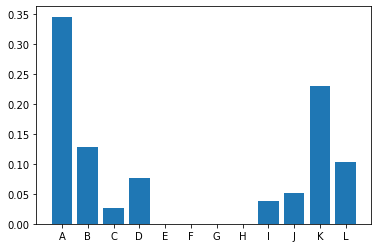

In [ ]:
names = list(freq.keys())
values = categ_alphabet[1]

plt.bar(range(len(freq)),values,tick_label=names)

In [ ]:
df_train_reduced = df_train.copy()
df_train_reduced['protein_sequence'] = proteins
df_train_reduced.to_csv("prot_alphabet_reduced.csv")

In [ ]:
df_train_categ = df_train.copy()
for i,value in enumerate(set(list(vocab.values()))):
  df_train_categ[value] = np.array(categ_alphabet)[:,i]

In [ ]:
df_train_categ.to_csv("prot_composition.csv")

**TO DO LIST**

**Make a dataset with this new reduced alphabet without remove outliers.**

**Find a way to generate good embeddings from the categorical distribution**

**Use DOI to find more information. Webscrapping**


In [ ]:
df_train = import_data("prot_alphabet_reduced.csv")

In [ ]:
df_train.head()

,protein_sequence,pH,data_source,tm,protein_length
seq_id,,,,,
0,-A---A---A---A-------A---A---A-------A--------...,7.0,doi.org/10.1038/s41592-020-0801-4,75.7,341
1,-A---A---A---B---K-------L-------J---D--------...,7.0,doi.org/10.1038/s41592-020-0801-4,50.5,286
2,-A---A---A---------------L-------A------------...,7.0,doi.org/10.1038/s41592-020-0801-4,40.5,497
3,-A---A---A-------K---------------A-------L---A...,7.0,doi.org/10.1038/s41592-020-0801-4,47.2,265
5,-A---A---H-------I-----------------------L----...,7.0,doi.org/10.1038/s41592-020-0801-4,48.4,380


## **3-Gram Partition of Data**

Here, the whole sequence of the protein is tokenized on 3 shifts of 3-grams with overlapping through a word-2-vec method.

In [ ]:
df_train = import_data("no_outliers.csv")

{'whiskers': [<matplotlib.lines.Line2D at 0x7fcd4e0bde80>,
 'caps': [<matplotlib.lines.Line2D at 0x7fcd4e0cc280>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fcd4e0bdb20>],
 'medians': [<matplotlib.lines.Line2D at 0x7fcd4e0cce50>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fcd4e0ccfd0>],
 'means': []}

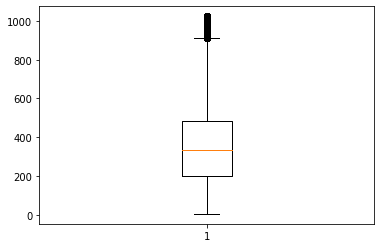

In [ ]:
plt.boxplot(df_train['protein_length'])

In [ ]:
from nltk import ngrams

prot_grams = []
grams_shifts = []
n_grams = 3 #number of grams from sequence
n_shifts = 3 #number of shifts from sequence
for i in df_train.index:
  grams_shifts = []
  for k in range(n_shifts):
    grams_shifts = [''.join(list(grams)) for grams in ngrams(df_train.loc[i, 'protein_sequence'][k:],n_grams)]
    prot_grams.append(grams_shifts)

In [ ]:
print("Shape of protein n-grams : ", (len(prot_grams),len(prot_grams[0]),len(prot_grams[0][0])))

Shape of protein n-grams :  (81423, 339, 3)


Now we have a basis with (n_proteins, n_shifts, protein length, n_grams). On protein length, we must remember that overlapping is considered for the shifts of the aminoacid sequences.

In [ ]:
#save_tokens_to_file(token_list=prot_grams)

# **Generate Embedding**

Here, a skip-gram neural network is applied to extract embeddings for the previous n-gram sequences.

In [ ]:
from gensim.models import Word2Vec
import gensim

In [ ]:
embedding_dim=100

In [ ]:
model = Word2Vec(sentences=df_train_reduced['protein_sequence'], size=embedding_dim, window=3, min_count=50,sg=1,hs=0)

In [ ]:
model.wv.save_word2vec_format('word2vec_4',binary=False)

In [ ]:
len(model.wv.vocab)

8000

## **Target variable analysis**

(array([6.4900e+02, 9.7390e+03, 1.2485e+04, 2.9420e+03, 1.5800e+03,
        1.0390e+03, 5.3700e+02, 6.0000e+00, 3.0000e+00, 1.0000e+00]),
 array([-26.26000483, -15.77000483,  -5.28000483,   5.20999517,
         15.69999517,  26.18999517,  36.67999517,  47.16999517,
         57.65999517,  68.14999517,  78.63999517]),
 <a list of 10 Patch objects>)

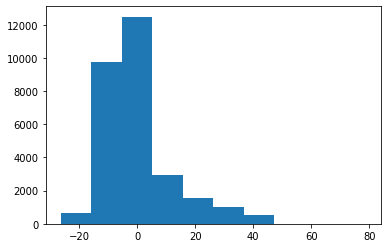

In [ ]:
import matplotlib.pyplot as plt
temp = (df_train['tm'] - np.mean(df_train['tm']))/np.std(df_train['tm'])
plt.hist(df_train['tm'] - np.mean(df_train['tm']))

In [ ]:
qcut = pd.qcut(temp, 4)
df_train['tm_range'] = qcut

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False).fit_transform(np.array(df_train['tm_range']).reshape(-1,1))
df_train['tm_q1'] = [int(x) for x in encoder[:,0]]
df_train['tm_q2'] = [int(x) for x in encoder[:,1]]
df_train['tm_q3'] = [int(x) for x in encoder[:,2]]
df_train['tm_q4'] = [int(x) for x in encoder[:,3]]

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(np.array(df_train['tm']).reshape(-1,1))

In [ ]:
y_train = np.zeros((len(prot_grams),4))
for i in range(len(df_train)):
  y_train[i:i+4,0] = df_train.loc[df_train.index[i],'tm_q1']
  y_train[i:i+4,1] = df_train.loc[df_train.index[i],'tm_q2']
  y_train[i:i+4,2] = df_train.loc[df_train.index[i],'tm_q3']
  y_train[i:i+4,3] = df_train.loc[df_train.index[i],'tm_q4']

In [ ]:
y_train = pd.DataFrame(np.repeat(df_train[['tm_q1','tm_q2','tm_q3','tm_q4']].values,n_shifts,axis=0))

In [ ]:
y_train.head(12)

,0,1,2,3
0,0,0,0,1
1,0,0,0,1
2,0,0,0,1
3,0,0,1,0
4,0,0,1,0
5,0,0,1,0
6,1,0,0,0
7,1,0,0,0
8,1,0,0,0
9,0,1,0,0


In [ ]:
y_train = np.array(y_train)

In [ ]:
len(y_train)

86943

# **Pre-processing**

In [ ]:
def to_num_sequences(X,vocab=SDM12l):
  num_sequences = {}
  i = 1
  for value in vocab.values():
    num_sequences[value] = i
    i += 1

  num_sequences['-'] = 0
  numeric_sequences = []
  for i, sequence in enumerate(X):
    tokens = list(sequence)
    nums = []
    for token in tokens:
      nums.append(num_sequences[token])
    numeric_sequences.append(nums)
  
  return numeric_sequences


In [ ]:
num_sequences = to_num_sequences(X=df_train['protein_sequence'])

In [ ]:
num_

[[0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  11,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  12,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  9,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  12,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  11,
  0,
  0,
  0,
  9,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  12,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  11,
  0,
  0,
  0,
  2,
  0,
  0,
  0,
  11,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  11,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2,
  

In [ ]:
len(sequences)

27141

In [ ]:
len(sequences[4])

137

# **Example Model**

In [ ]:
import os

embeddings_index = {}
f = open('word2vec_4',encoding='utf-8')
for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:])
  embeddings_index[word] = coefs
f.close()

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
tokenizer_obj = Tokenizer()
tokenizer_obj.fit_on_texts(prot_grams)

In [ ]:
max_length = max([len(x) for x in prot_grams])

In [ ]:
sequences = tokenizer_obj.texts_to_sequences(prot_grams)

In [ ]:
word_index = tokenizer_obj.word_index
print("Found %s unique tokens" % len(word_index))

proteins_pad = pad_sequences(sequences, maxlen=max_length)

Found 8000 unique tokens


In [ ]:
print("Shape of pad protein sequence: ",proteins_pad.shape)
print("Shape of temperature data: ", y_train.shape)

Shape of pad protein sequence:  (81423, 1022)
Shape of temperature data:  (86943, 4)


In [ ]:
num_words = len(word_index) + 1
embedding_matrix = np.zeros((num_words,embedding_dim))

for word, i in word_index.items():
  if i>num_words:
    continue
  embedding_vector = embeddings_index.get(word)
  if(embedding_vector is not None):
    embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape

(8001, 100)

In [ ]:
import numpy, scipy.sparse
from sparsesvd import sparsesvd

In [ ]:
smat = scipy.sparse.csc_matrix(proteins_pad)

In [ ]:
np.max(proteins_pad)

8000

In [ ]:
from sys import getsizeof

getsizeof(proteins_pad)/10**6

332.857344

## Train/Test split

In [ ]:
from tensorflow import keras
import tensorflow as tf
from keras.layers import Conv1D, Dense, Flatten, MaxPooling1D,Embedding,LSTM,Bidirectional,TimeDistributed,CuDNNLSTM,Dropout
from keras.initializers import Constant

model = keras.Sequential()
embedding_layer = Embedding(num_words,embedding_dim,embeddings_initializer=Constant(embedding_matrix),input_length=max_length,trainable=False)
model.add(embedding_layer)
#forward_layer = LSTM(units=30,activation='tanh',dropout=0.2,recurrent_activation='sigmoid',unroll=False,use_bias=True,return_sequences=True)
#backward_layer = LSTM(go_backwards=True,units=30,activation='tanh',dropout=0.2,recurrent_activation='sigmoid',unroll=False,use_bias=True,return_sequences=True)
lstm_layer = LSTM(units=64,activation='tanh',recurrent_activation='sigmoid',unroll=False,use_bias=True,return_sequences=True)
model.add(Bidirectional(lstm_layer))
#model.add(Bidirectional(forward_layer,backward_layer=backward_layer))
lstm_layer2 = LSTM(units=32,activation='tanh',recurrent_activation='sigmoid',unroll=False,use_bias=True,return_sequences=False)
model.add(Bidirectional(lstm_layer2))
model.add(Dropout(0.25))
model.add(Dense(4,activation='softmax'))

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])


In [ ]:
model.save_weights("tests.h5")

In [ ]:
validation_split = 0.2
indices = np.arange(proteins_pad.shape[0])
np.random.shuffle(indices)
proteins_pad = proteins_pad[indices]

temperature = y_train[indices]

num_validation_samples = int(validation_split*proteins_pad.shape[0])
X_train = proteins_pad[:-num_validation_samples]
y_train = temperature[:-num_validation_samples]

X_validation = proteins_pad[-num_validation_samples:]
y_validation = temperature[-num_validation_samples:]


print("Shape of train features data: ", X_train.shape)
print("Shape of train target data: ", y_train.shape)

print("Shape of validation features data: ", X_validation.shape)
print("Shape of validation target data: ", y_validation.shape)


IndexError: ignored

## Clear memory

In [ ]:
del tokenizer_obj

In [ ]:
del sequences

In [ ]:
del embedding_matrix

In [ ]:
del prot_grams

## Fit

In [ ]:
y_train.shape

(65139, 4)

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 1022, 100)         800100    
                                                                 
 bidirectional_2 (Bidirectio  (None, 1022, 128)        84480     
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               41216     
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 4)                 260       
                                                                 
Total params: 926,056
Trainable params: 125,956
Non-tr

In [ ]:
model.fit(x=X_train,y=y_train, batch_size=128,epochs=3,validation_data=(X_validation,y_validation),verbose=1)

In [ ]:
model.load_weights('tests.h5')

In [ ]:
pred = model.predict(X_validation)

509/509 [==============================] - 250s 490ms/step


In [ ]:
len(pred)

16284

In [ ]:
df_predict = pd.DataFrame()
df_predict['pred.c1'] = pred[:,0]
df_predict['pred.c2'] = pred[:,1]
df_predict['pred.c3'] = pred[:,2]
df_predict['pred.c4'] = pred[:,3]
df_predict['target.c1'] = y_validation[:,0]
df_predict['target.c2'] = y_validation[:,1]
df_predict['target.c3'] = y_validation[:,2]
df_predict['target.c4'] = y_validation[:,3]

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
y_pred = np.zeros((len(y_validation),4))
for i in range(len(y_pred)):
  y_pred[i,np.argmax(pred[i])] = 1

In [ ]:
accuracy_score(y_validation,y_pred)

0.251903709162368

In [ ]:
ranges = list(set(qcut))

In [ ]:
pd.DataFrame(pred).describe()

,0,1,2,3
count,16284.0000,16284.00000,16284.000000,16284.000000
mean,0.2494,0.25028,0.247914,0.252406
std,0.0000,0.00000,0.000000,0.000000
min,0.2494,0.25028,0.247914,0.252406
25%,0.2494,0.25028,0.247914,0.252406
50%,0.2494,0.25028,0.247914,0.252406
75%,0.2494,0.25028,0.247914,0.252406
max,0.2494,0.25028,0.247914,0.252406


In [ ]:
prediction = pd.DataFrame()
for i in range(len(y_pred)):
  prediction.loc[i,'left'] = ranges[np.argmax(y_pred[i])].left
  prediction.loc[i,'right'] = ranges[np.argmax(y_pred[i])].right

(array([16462.,     0.,     0., 16393.,     0.,     0., 16010.,     0.,
            0., 16274.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

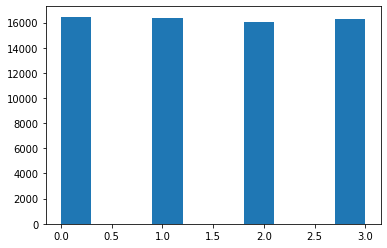

In [ ]:
test = []
for i in range(len(y_train)):
  test.append(np.argmax(y_train[i,:]))
plt.hist(test)

(array([4091.,    0.,    0., 4064.,    0.,    0., 4027.,    0.,    0.,
        4102.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <a list of 10 Patch objects>)

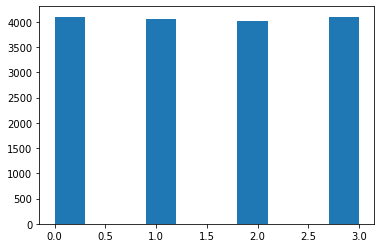

In [ ]:
test = []
for i in range(len(y_validation)):
  test.append(np.argmax(y_validation[i,:]))
plt.hist(test)

In [ ]:
pd.DataFrame(y_pred).describe()

,0,1,2,3
count,16284.0,16284.0,16284.0,16284.0
mean,0.0,0.0,0.0,1.0
std,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,1.0
25%,0.0,0.0,0.0,1.0
50%,0.0,0.0,0.0,1.0
75%,0.0,0.0,0.0,1.0
max,0.0,0.0,0.0,1.0


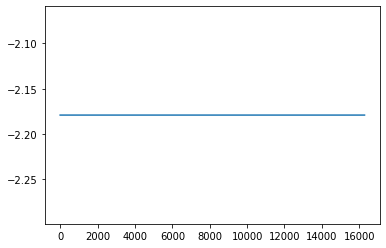

In [ ]:
plt.plot(prediction['left'])

In [ ]:
[print(i.shape, i.dtype) for i in keras_model.inputs]
[print(o.shape, o.dtype) for o in keras_model.outputs]
[print(l.name, l.input_shape, l.dtype) for l in keras_model.layers]

In [ ]:
keras_model.fit(np.array(prot_grams), y_train, epochs=2, batch_size=128)